# Cleaning and Filtering

1. Check whether Sepp data has had any prior normalization applied
2. Check for and remove features with fewer than 5 counts
3. Filter out nuclei with particularly low feature counts
4. Filter out nuclei with particularly high MT/Ribo counts
5. Remove all MT/Ribo features
6. Remove any features with egregiously high expression that may affect normalization (e.g. MALAT1)\
\
Following [Chuck's PFC notebook](https://github.com/ListerLab/pfc_development/blob/master/snRNAseq/notebooks/02__clean-and-filter.ipynb)

In [1]:
import anndata as ad
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from matplotlib.pyplot import rc_context

In [2]:
sc.logging.print_header()

/home/cmcphan/.conda/envs/anndata/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.10.3 anndata==0.10.9 umap==0.5.6 numpy==2.0.2 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.3 igraph==0.11.6 pynndescent==0.5.13


In [3]:
herring_data = ad.read_h5ad('/group/ll005/cmcphan/herring_data/Processed_data_RNA-all_full-counts-and-downsampled-CPM.h5ad')
sepp_data_human = ad.read_h5ad('/group/ll005/cmcphan/sepp_data/sepp_human.h5ad')
sepp_data_mouse = ad.read_h5ad('/group/ll005/cmcphan/sepp_data/sepp_mouse.h5ad')
sepp_data_opossum = ad.read_h5ad('/group/ll005/cmcphan/sepp_data/sepp_opossum.h5ad')

In [4]:
sepp_data_human.X.sum()

np.float32(627997700.0)

In [5]:
sepp_data_mouse.X.sum()

np.float32(198273390.0)

In [6]:
sepp_data_opossum.X.sum()

np.float32(347208260.0)

All Sepp datasets have integer counts, so it doesn't appear that any normalization has been done already.

#### Remove features with low presence
We know this has already been done on the Herring dataset - bring the Sepp datasets up to par

In [7]:
herring_data.shape

(154748, 26747)

In [8]:
# Check to make sure
sc.pp.filter_genes(herring_data, min_cells = 5, inplace = True)
herring_data.shape

(154748, 26747)

No change, as expected

In [9]:
sepp_data_human.shape

(180956, 27715)

In [10]:
sc.pp.filter_genes(sepp_data_human, min_cells = 5, inplace = True)
sepp_data_human.shape

(180956, 27367)

Removed 348 genes

In [11]:
sepp_data_mouse.shape

(115282, 20684)

In [12]:
sc.pp.filter_genes(sepp_data_mouse, min_cells = 5, inplace = True)
sepp_data_mouse.shape

(115282, 20682)

Removed 2 genes

In [13]:
sepp_data_opossum.shape

(99498, 28806)

In [14]:
sc.pp.filter_genes(sepp_data_opossum, min_cells = 5, inplace = True)
sepp_data_opossum.shape

(99498, 28806)

No change

#### Calculate and plot feature counts and library sizes

In [15]:
sc.pp.calculate_qc_metrics(sepp_data_human, percent_top = None, inplace = True)
sc.pp.calculate_qc_metrics(sepp_data_mouse, percent_top = None, inplace = True)
sc.pp.calculate_qc_metrics(sepp_data_opossum, percent_top = None, inplace = True)

In [16]:
# Add batch order list to uns, with batches ordered according to sample age
sepp_data_human.uns['batch_order'] = sepp_data_human.obs[['batch', 'numerical_age']].drop_duplicates().sort_values(by = 'numerical_age')['batch'].values
sepp_data_mouse.uns['batch_order'] = sepp_data_mouse.obs[['batch', 'numerical_age']].drop_duplicates().sort_values(by = 'numerical_age')['batch'].values
sepp_data_opossum.uns['batch_order'] = sepp_data_opossum.obs[['batch', 'numerical_age']].drop_duplicates().sort_values(by = 'numerical_age')['batch'].values

In [17]:
# Chuck's misc code, which we will use for random batch colour generation
import new_misc_code as nmc

In [18]:
sepp_data_human.uns['batch_colors'] = nmc.random_hex_colors( n_colors=len( sepp_data_human.uns['batch_order']), random_seed=0)
sepp_data_human.uns['batch_colors_dict'] = dict( zip( sepp_data_human.obs['batch'].cat.categories.tolist(), sepp_data_human.uns['batch_colors']))

sepp_data_mouse.uns['batch_colors'] = nmc.random_hex_colors( n_colors=len( sepp_data_mouse.uns['batch_order']), random_seed=0)
sepp_data_mouse.uns['batch_colors_dict'] = dict( zip( sepp_data_mouse.obs['batch'].cat.categories.tolist(), sepp_data_mouse.uns['batch_colors']))

sepp_data_opossum.uns['batch_colors'] = nmc.random_hex_colors( n_colors=len( sepp_data_opossum.uns['batch_order']), random_seed=0)
sepp_data_opossum.uns['batch_colors_dict'] = dict( zip( sepp_data_opossum.obs['batch'].cat.categories.tolist(), sepp_data_opossum.uns['batch_colors']))

In [19]:
# Calculate log10 gene counts and log10 UMI counts for each nucleus, for plotting and filtering
sepp_data_human.obs['log10_gene_counts'] = np.log10( sepp_data_human.obs['n_genes_by_counts'])
sepp_data_human.obs['log10_UMI_counts']  = np.log10( sepp_data_human.obs['total_counts'])

sepp_data_mouse.obs['log10_gene_counts'] = np.log10( sepp_data_mouse.obs['n_genes_by_counts'])
sepp_data_mouse.obs['log10_UMI_counts']  = np.log10( sepp_data_mouse.obs['total_counts'])

sepp_data_opossum.obs['log10_gene_counts'] = np.log10( sepp_data_opossum.obs['n_genes_by_counts'])
sepp_data_opossum.obs['log10_UMI_counts']  = np.log10( sepp_data_opossum.obs['total_counts'])

In [20]:
# Create list of our anndata objects
adata_list = [herring_data, sepp_data_human, sepp_data_mouse, sepp_data_opossum]

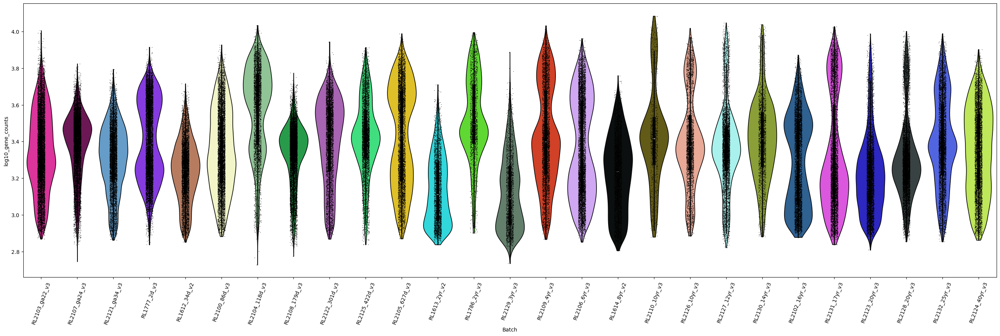

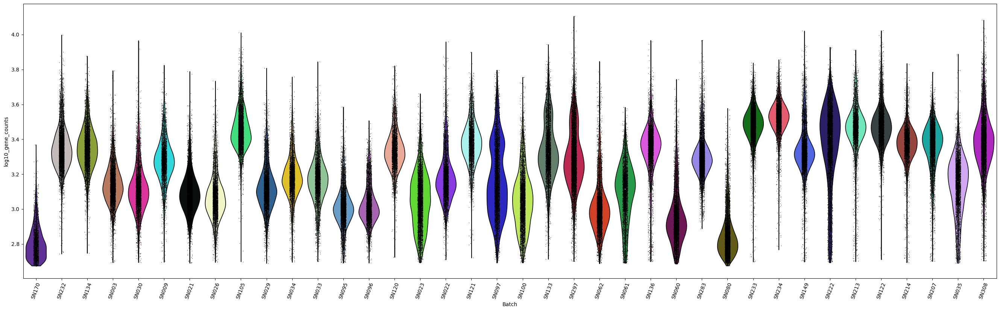

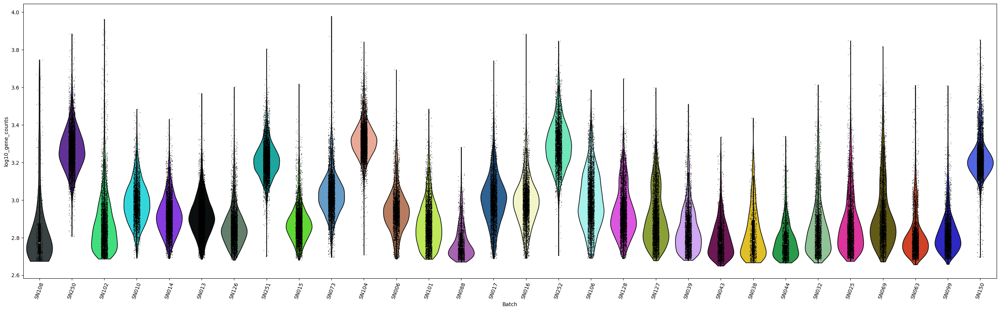

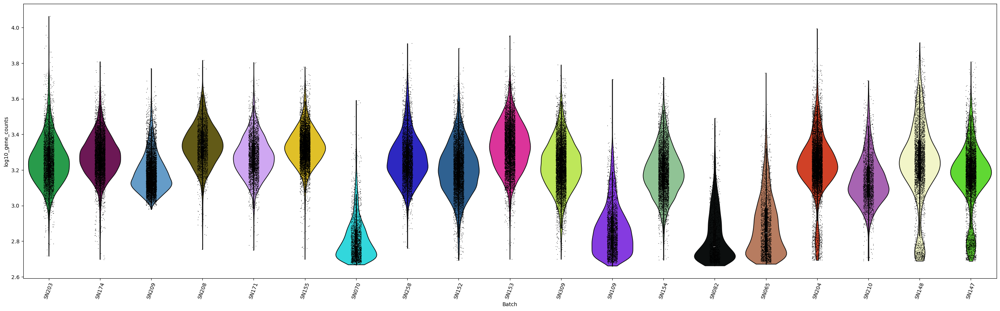

In [21]:
# Plot feature counts by batch for each dataset
for adata in adata_list:
    with rc_context({'figure.figsize': (25,10)}):
        ax = sc.pl.violin( adata, ['log10_gene_counts'], groupby='batch', stripplot=True, 
                      inner='box', order=adata.uns['batch_order'], rotation=70, xlabel='Batch', show=False)

In general, seems the Sepp datasets have more variance in sample quality than the Herring data - some samples seem to have significantly lower average feature counts, though none seem to be catastrophic. A couple of the opossum samples seem to have collections of cells with much lower feature counts than the rest in that sample, e.g. SN204, SN140, SN147. Expect that these might be filtered out by MAD.

#### Sepp datasets checking covariates

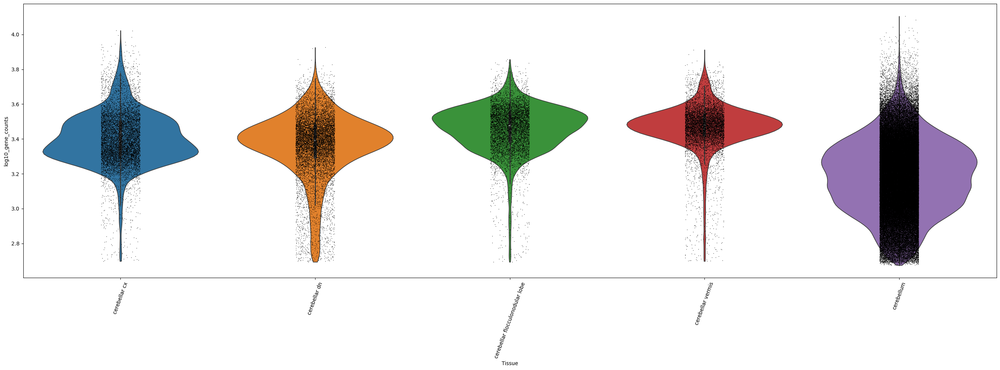

In [22]:
# Plot feature counts by tissue for the Sepp human dataset - the others only have cerebellum
with rc_context({'figure.figsize': (25,10)}):
    ax = sc.pl.violin( sepp_data_human, ['log10_gene_counts'], groupby='Tissue', stripplot=True, 
                  inner='box', rotation=70, xlabel='Tissue', show=False)

Doesn't seem to be any obvious problems due to tissue

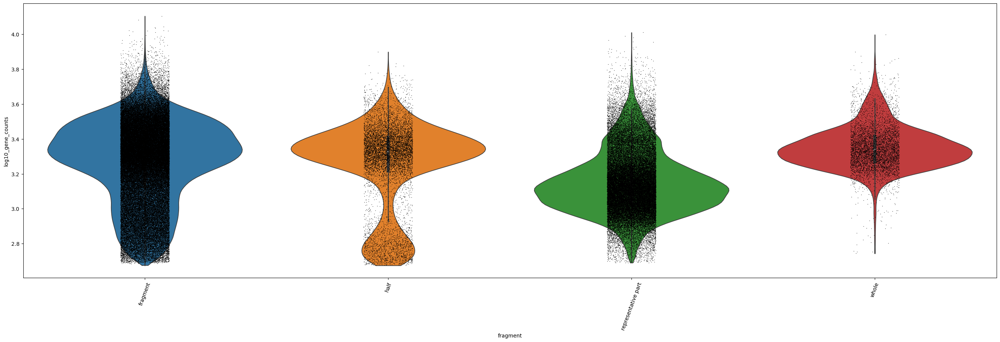

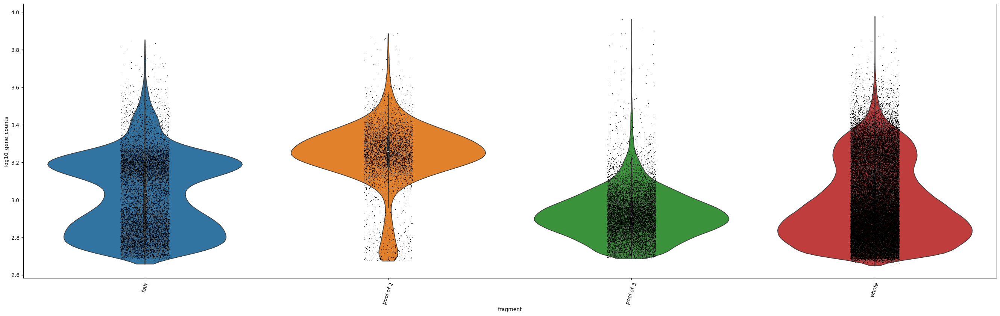

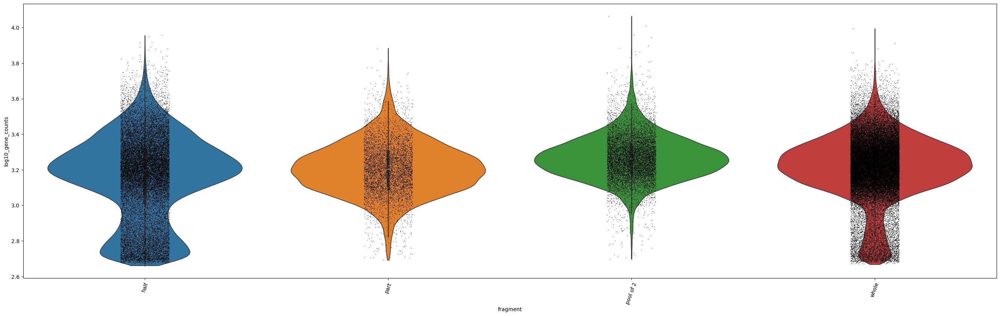

In [23]:
# Plot feature counts by fragment type for the Sepp datasets
for adata in [sepp_data_human, sepp_data_mouse, sepp_data_opossum]:    
    with rc_context({'figure.figsize': (25,10)}):
        ax = sc.pl.violin( adata, ['log10_gene_counts'], groupby='fragment', stripplot=True, 
                      inner='box', rotation=70, xlabel='fragment', show=False)

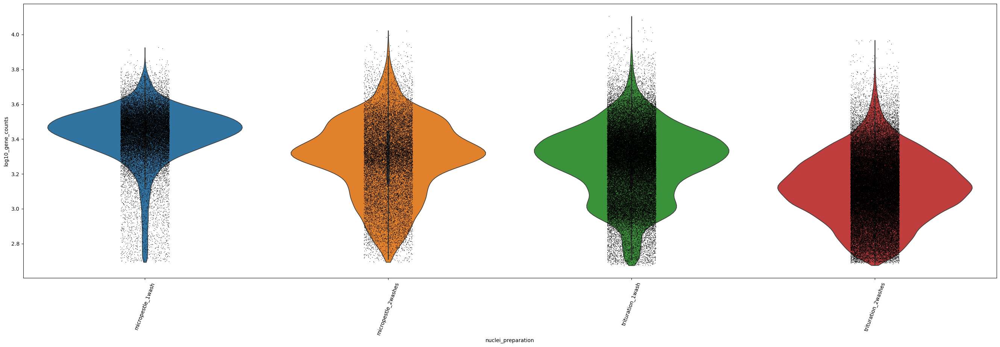

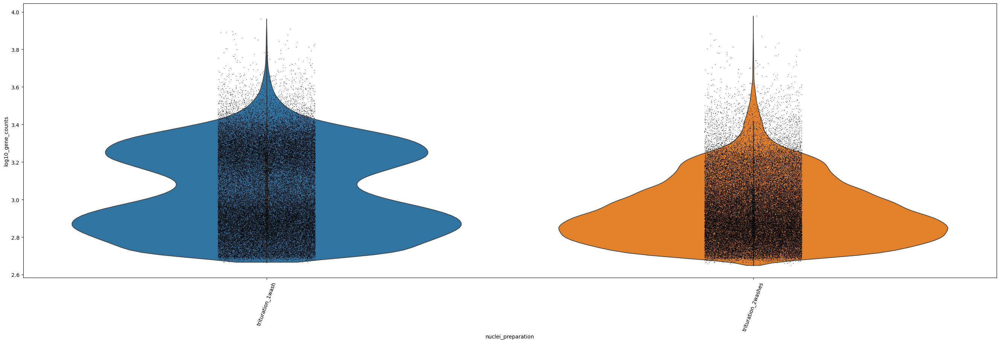

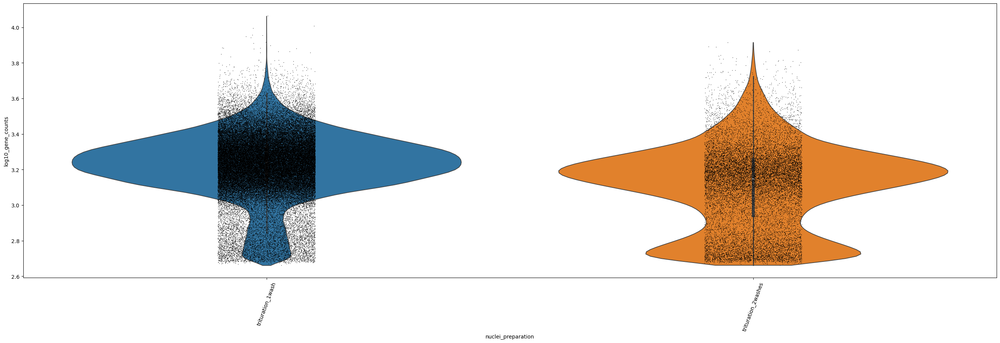

In [24]:
# Plot feature counts by nuclei preparation method for the Sepp datasets
for adata in [sepp_data_human, sepp_data_mouse, sepp_data_opossum]:    
    with rc_context({'figure.figsize': (25,10)}):
        ax = sc.pl.violin( adata, ['log10_gene_counts'], groupby='nuclei_preparation', stripplot=True, 
                      inner='box', rotation=70, xlabel='nuclei_preparation', show=False)

#### Library sizes

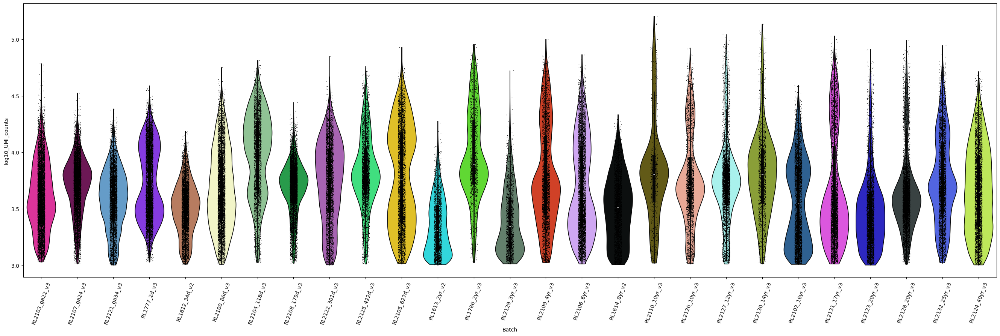

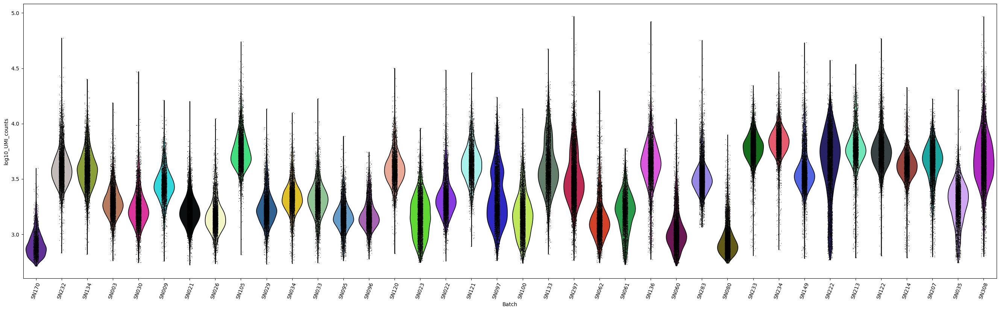

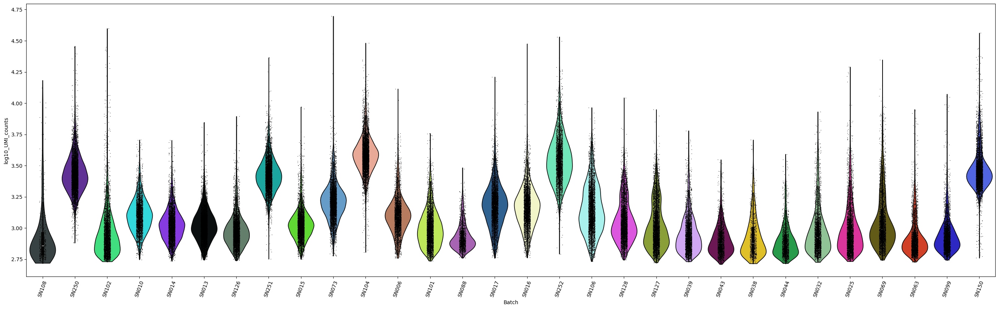

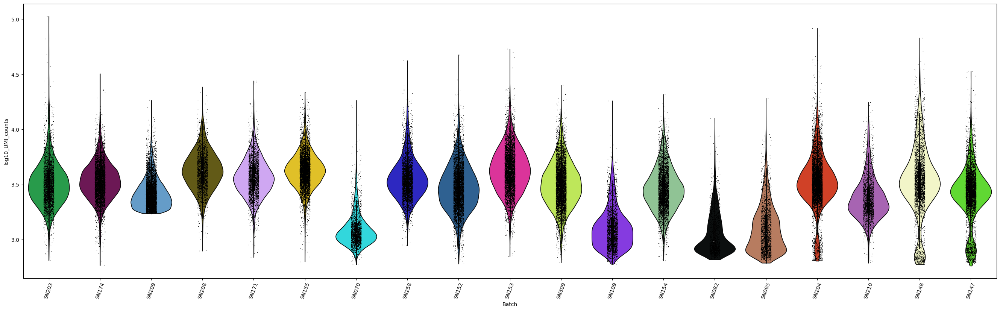

In [25]:
# Plot feature counts by batch for each dataset
for adata in adata_list:
    with rc_context({'figure.figsize': (25,10)}):
        ax = sc.pl.violin( adata, ['log10_UMI_counts'], groupby='batch', stripplot=True, 
                      inner='box', order=adata.uns['batch_order'], rotation=70, xlabel='Batch', show=False)

Looks okay, but many of the mouse batches appear to be pretty low quality. Whether or not they are usable will remain to be seen, after UMAP and clustering is done. Some of the opossum batches have a population of much lower quality - these should be filtered out. If not picked up by this filtering, they should cluster together on UMAP and be removable that way.

## Remove nuclei with low feature counts

In [26]:
# Using some functions Chuck defined in his 02__clean-and-filter notebook, collated into a file for import
import plotting_functions as pf

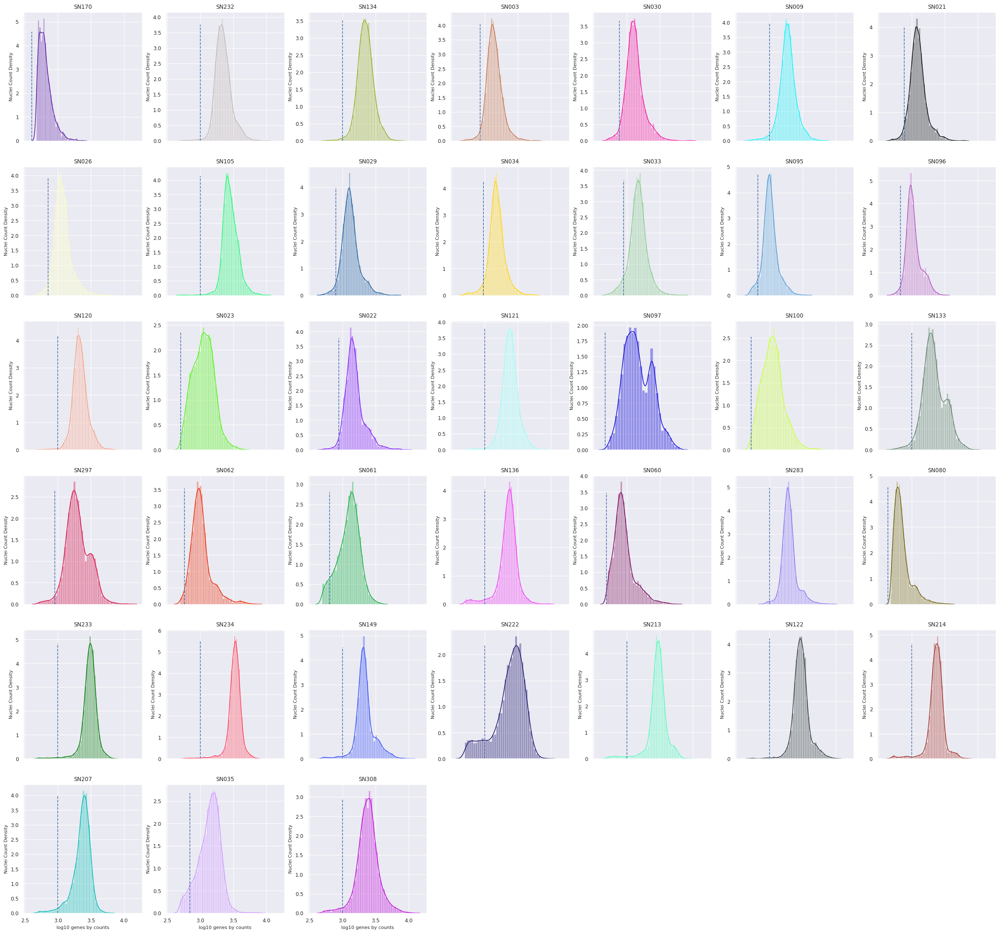

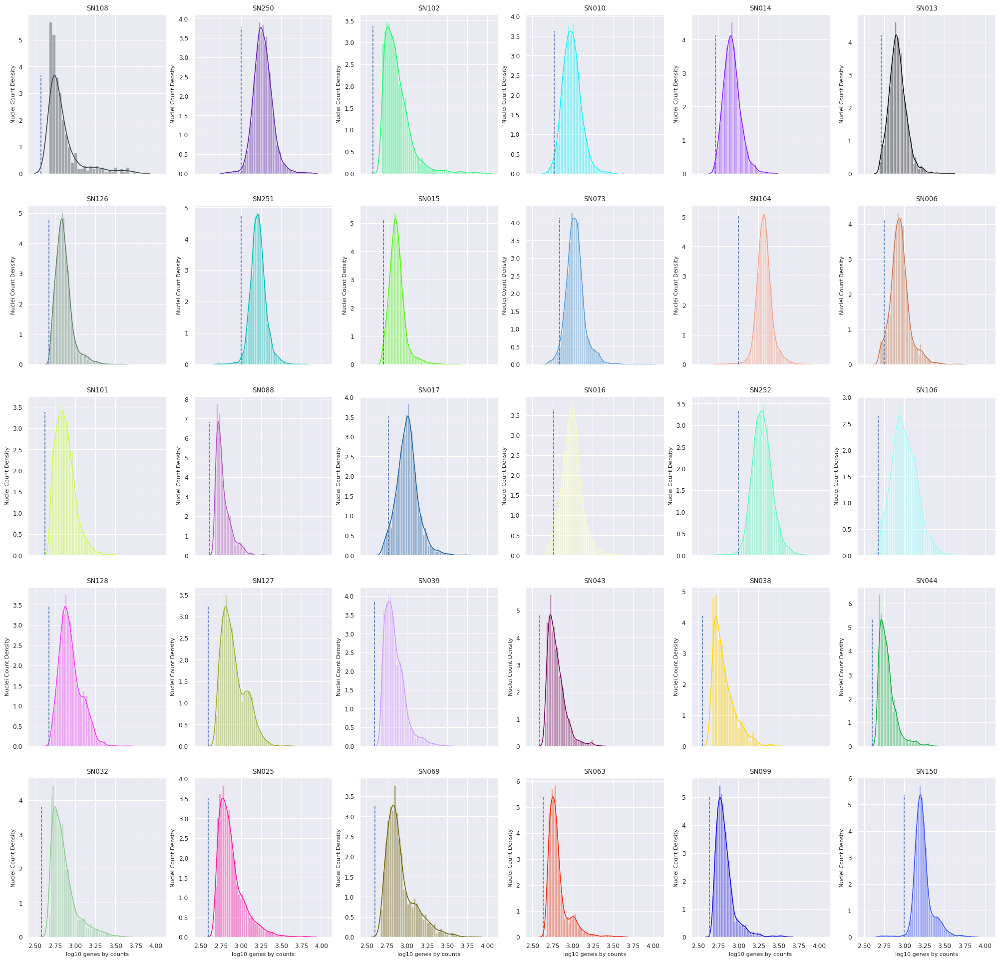

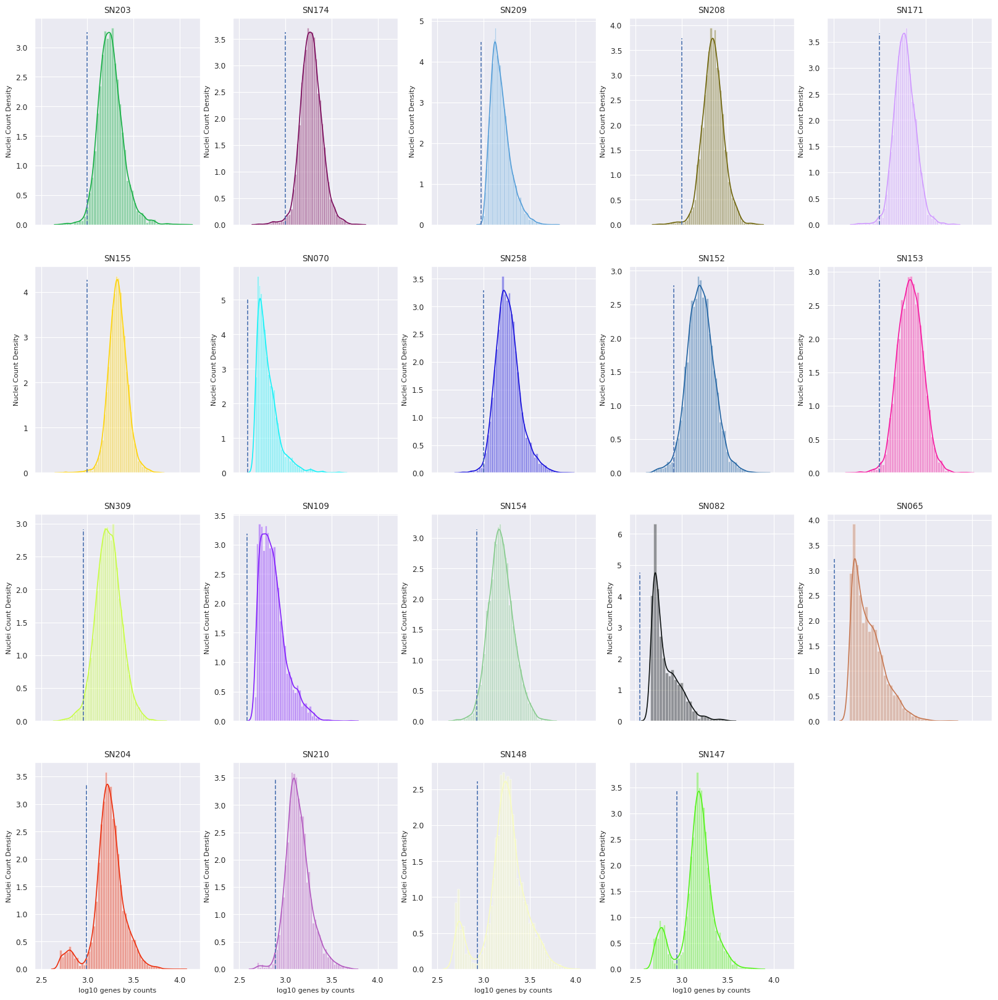

In [27]:
low_feat_mks = [] # Keep list of masks for low feature counts
# Already done on the Herring dataset, we don't want to cut it down any more unnecessarily by recalculating over the already filtered nuclei,
# so just perform this on the Sepp data
for adata in adata_list[1:]:
    low_feat_mks.append(pf.plot_mask_feature_per_nuc(adata, feature = 'n_genes_by_counts', max_th = 1000, 
                                                     xlab = 'log10 genes by counts', mad_scale=3.0))

In [28]:
# Note that the mask is True if a nucleus has a low feature count we want to filter out, and False if not and it should be kept
# As such we actually want the complement of the mask (i.e. keep all True, discard all False), hence the ~ (bitwise NOT)
for i, (adata, mask) in enumerate(zip(adata_list[1:], low_feat_mks)):
    adata_list[i+1] = pf.mask_cells(adata, ~mask)

Number of removed nuclei per sample:
batch
SN222    474
SN095    277
SN035    261
SN033    234
SN061    196
SN136    196
SN308    180
SN297    170
SN034    162
SN207    140
SN030    119
SN029    117
SN003    116
SN026    109
SN149     99
SN021     97
SN213     93
SN022     90
SN062     89
SN096     82
SN009     77
SN133     76
SN214     75
SN283     58
SN233     45
SN232     38
SN134     35
SN100     31
SN234     25
SN120     19
SN121     17
SN122     15
SN105     11
SN023     10
SN060      2
Total removed =  3835
Number of removed nuclei per sample:
batch
SN073    166
SN017    134
SN006    130
SN016    117
SN150     63
SN015     63
SN251     62
SN013     57
SN010     50
SN250     47
SN104     32
SN014     31
SN252     26
Total removed =  978
Number of removed nuclei per sample:
batch
SN147    947
SN204    591
SN148    468
SN309    203
SN152    151
SN154    114
SN174     76
SN203     68
SN153     56
SN258     49
SN155     42
SN210     40
SN171     37
SN208     20
Total removed =  2862


Removed lower quality cells. Critically, removed the clusters of much lower quality opossum nuclei in some batches.

### Remove nuclei with high mitochondrial gene counts

Note that the mouse gene symbols come from MGI, which has a different naming convention to HGNC, which is used for the human and opossum datasets. MGI mitochrondrial genes are prefixed with 'mt-', see [here](https://www.informatics.jax.org/mgihome/nomen/gene.shtml#:~:text=Genes%20residing%20on%20the%20mitochondria%20have%20a%20prefix%20mt%2D%20(lowercase,mitochondrial%20genes%20is%20Chr%20MT.).

In [29]:
# Look for mitochondrial genes by checking for gene symbols beginning with MT- (human) or mt- (mouse) and compute fraction of 
#     total gene counts
# These have already been removed in the Herring data, so just clean the Sepp data
# Note that for the Sepp data, the var_names are the Ensembl ID, not the gene symbol, so we need to check via the gene_symbol column
mito_mks = []
mito_genes = [] # Keep track of list of mito genes in each dataset
for adata in adata_list[1:]:
    mito_mk = adata.var['gene_symbol'].str.startswith(('MT-', 'mt-')).values
    mito_mks.append(mito_mk)
    genes = adata.var_names.values[mito_mk]
    mito_genes.append(adata.var[mito_mk]['gene_symbol'].values)
    adata.obs['percent_mito'] = np.sum( adata[:, genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1

Look at number of mitochondrial genes in each set:

In [30]:
for mask in mito_mks:
    print(sum(mask))

18
14
0


18 mitochondrial genes found in human dataset\
14 mt-genes in mouse\
0 in opossum

In [31]:
mito_genes[0]

['MT-RNR1', 'MT-RNR2', 'MT-ND1', 'MT-ND2', 'MT-CO1', ..., 'MT-ATP8', 'MT-ND6', 'MT-TL1', 'MT-TM', 'MT-TF']
Length: 18
Categories (22616, object): ['', 'A1BG', 'A1BG-AS1', 'A1CF', ..., 'ZYG11B', 'ZYX', 'ZZEF1', 'ZZZ3']

In [32]:
#mito_per_mks = []
# As above, no mitochondrial genes in opossum set, so don't plot it
#for adata, mito_mk in zip(adata_list[1:3], mito_mks[:2]):
    # remove all nuc with more than 3 MADs percentage mito gene counts
#    mito_per_mks.append(pf.gene_set_MAD_plot_and_mask( adata, mito_mk, 20.0))

In [33]:
#for adata, mask in zip(adata_list[1:3], mito_per_mks):
#    adata = pf.mask_cells(adata, ~mask)

---

#### Diagnosing Mito Weirdness

In [34]:
adata_list[2]

AnnData object with n_obs × n_vars = 114304 × 20682
    obs: 'orig_cluster', 'orig_sub_cluster', 'broad_lineage', 'cell_type', 'dev_state', 'subtype', 'precisest_label', 'species', 'Tissue', 'TissueID', 'batch', 'Capture.System', 'UMAP1', 'UMAP2', 'Stage', 'stage.ord', 'size_factor', 'sex', 'age', 'fragment', 'rqn_cytoplasm', 'nuclei_preparation', 'chromium_version', 'numerical_age', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito'
    var: 'ensembl_gene_id', 'gene_symbol', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'batch_order', 'batch_colors', 'batch_colors_dict', 'fragment_colors', 'nuclei_preparation_colors'

In [35]:
max(adata_list[1].obs[adata_list[1].obs['batch'] == 'SN003']['percent_mito'])

0.010177376680076122

In [36]:
import statistics as s
from scipy import stats

In [37]:
s.mean(adata_list[1].obs[adata_list[1].obs['batch'] == 'SN003']['percent_mito'])

0.00025455917416615834

In [38]:
len(adata_list[1].obs[adata_list[1].obs['batch']=='SN003'])

5333

In [39]:
sum(adata_list[1].obs[adata_list[1].obs['batch']=='SN003']['percent_mito']==0)

3409

In [40]:
stats.median_abs_deviation(adata_list[1].obs[adata_list[1].obs['batch'] == 'SN003']['percent_mito'])

np.float32(0.0)

Seems like what's happening in some batches is that the distribution is so centred on 0 that the MAD gets calculated as zero, so literally anything above zero is discarded. Could be avoided by adding a minimum threshold as well, e.g. 1%, to mitigate some of this behaviour.\
The fact that this is occurring indicates that there was probably some sort of filtering for mitochondrial RNA already done, corroborated by the extremely small mitochondrial gene counts compared to what might be expected.

In [41]:
np.median(adata_list[1].obs[adata_list[1].obs['batch'] == 'SN003']['percent_mito'])

np.float32(0.0)

In [42]:
len(adata_list[1].obs_names[adata_list[1].obs['batch']=='SN003'])

5333

In [43]:
import importlib
importlib.reload(pf)

<module 'plotting_functions' from '/group/ll005/cmcphan/notebooks/qc/plotting_functions.py'>

After discussion with Chuck, we agree that it seems that some sort of filtering for mitochondrial RNA has likely already been done, based on the odd distributions of mito counts above, especially compared to the ribo counts below. We expect mito and ribo content should be correlated, so having strange looking mito distributions and normal looking ribo ones doesn't make a lot of sense unless something has already been done.\
\
Conclusion is to ignore mito-based filtering here, and examine later if any extra filtering should be done based on UMAP and clustering.

---

### Remove nuclei with high ribosomal gene counts

When looking for ribosomal genes, Chuck checked against the [KEGG ribosome gene set](https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/KEGG_RIBOSOME.html) for humans.\
We will use the same gene set for the Sepp human and opossum data, since there doesn't appear to be a similar gene set for opossum and the gene symbols we used were projected HGNC symbols, so the gene set should still apply.\
For mice, there is a similar [mouse ribosomal gene set](https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/KEGG_RIBOSOME.html), which we will load in as a GMT file and check against.

In [44]:
import csv

ribo_mks = []
## HUMAN
# read in list of ribo genes from kegg
ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
ribo_genes_human = pd.read_table( ribo_url, header=[1])
# create mask for all ribo genes
ribo_mk = np.isin( sepp_data_human.var['gene_symbol'].values, ribo_genes_human)
sepp_data_human.obs['percent_ribo'] = np.sum( sepp_data_human[:,ribo_mk].X, axis=1).A1 / np.sum( sepp_data_human.X, axis=1).A1
ribo_mks.append(ribo_mk)

## MOUSE
ribo_genes_mouse = []
with open( 'mouse_ribo_genes.gmt', 'r') as f:
    reader = csv.reader( f, delimiter='\t')
    for row in reader:
        ribo_genes_mouse.append(row[2:])
ribo_mk = np.isin( sepp_data_mouse.var['gene_symbol'].values, ribo_genes_mouse)
sepp_data_mouse.obs['percent_ribo'] = np.sum( sepp_data_mouse[:,ribo_mk].X, axis=1).A1 / np.sum( sepp_data_mouse.X, axis=1).A1
ribo_mks.append(ribo_mk)

## OPOSSUM
# Since these gene symbols are projected HGNC symbols (i.e. human symbols), we use the human gene set
ribo_mk = np.isin( sepp_data_opossum.var['gene_symbol'].values, ribo_genes_human)
sepp_data_opossum.obs['percent_ribo'] = np.sum( sepp_data_opossum[:,ribo_mk].X, axis=1).A1 / np.sum( sepp_data_opossum.X, axis=1).A1
ribo_mks.append(ribo_mk)

Check number of ribosomal genes in each dataset:

In [45]:
for mask in ribo_mks:
    print(sum(mask))

87
244
32


87 in human\
244 in mouse\
32 in opossum

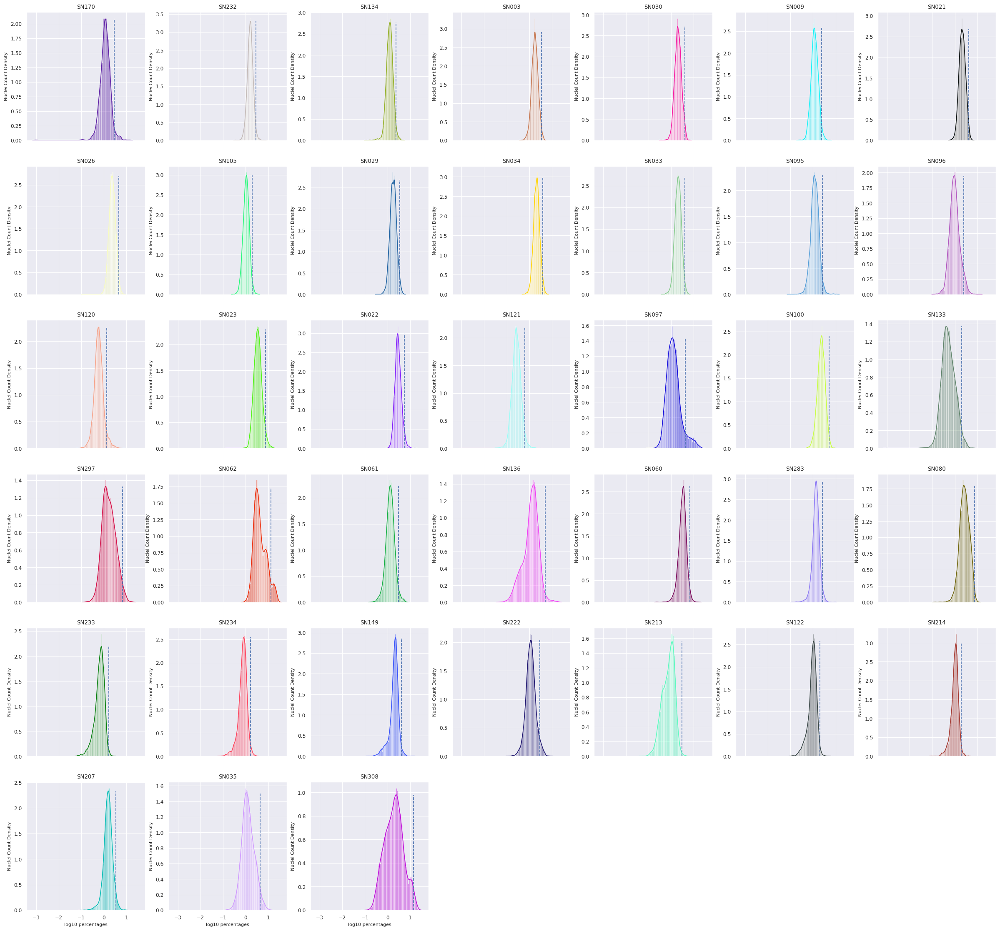

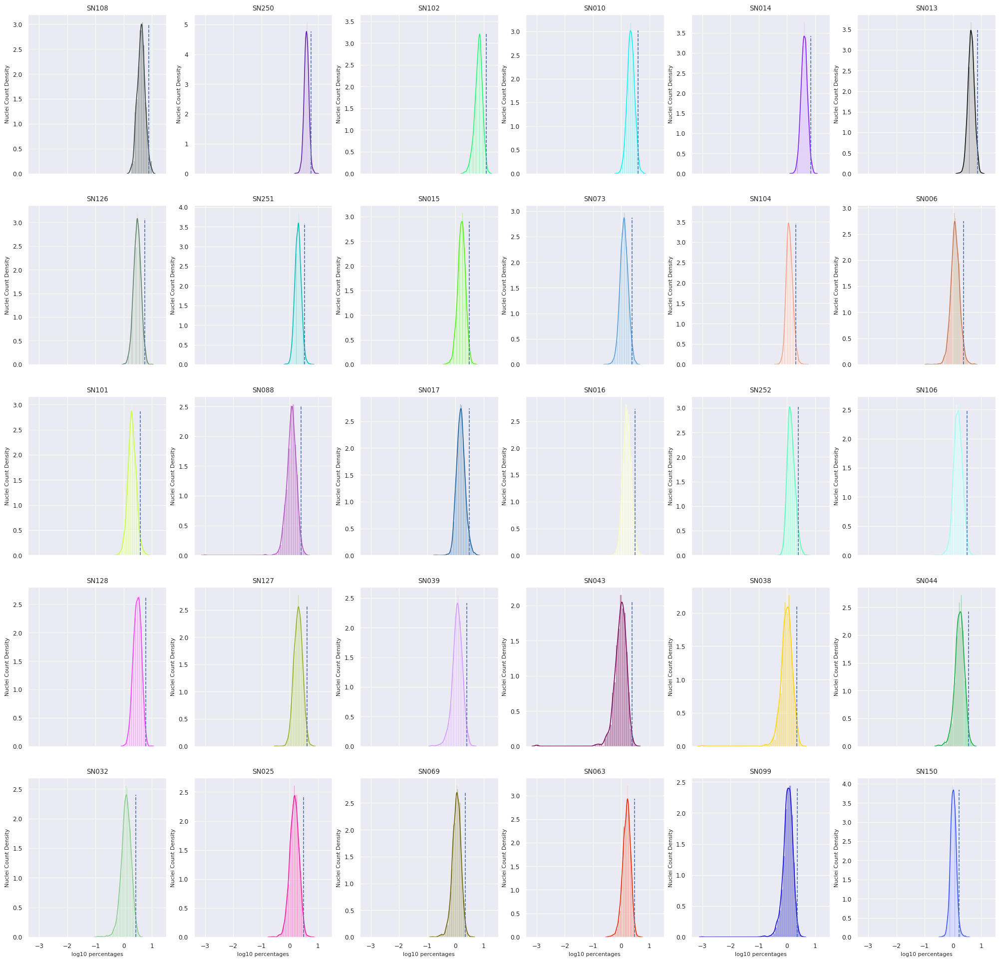

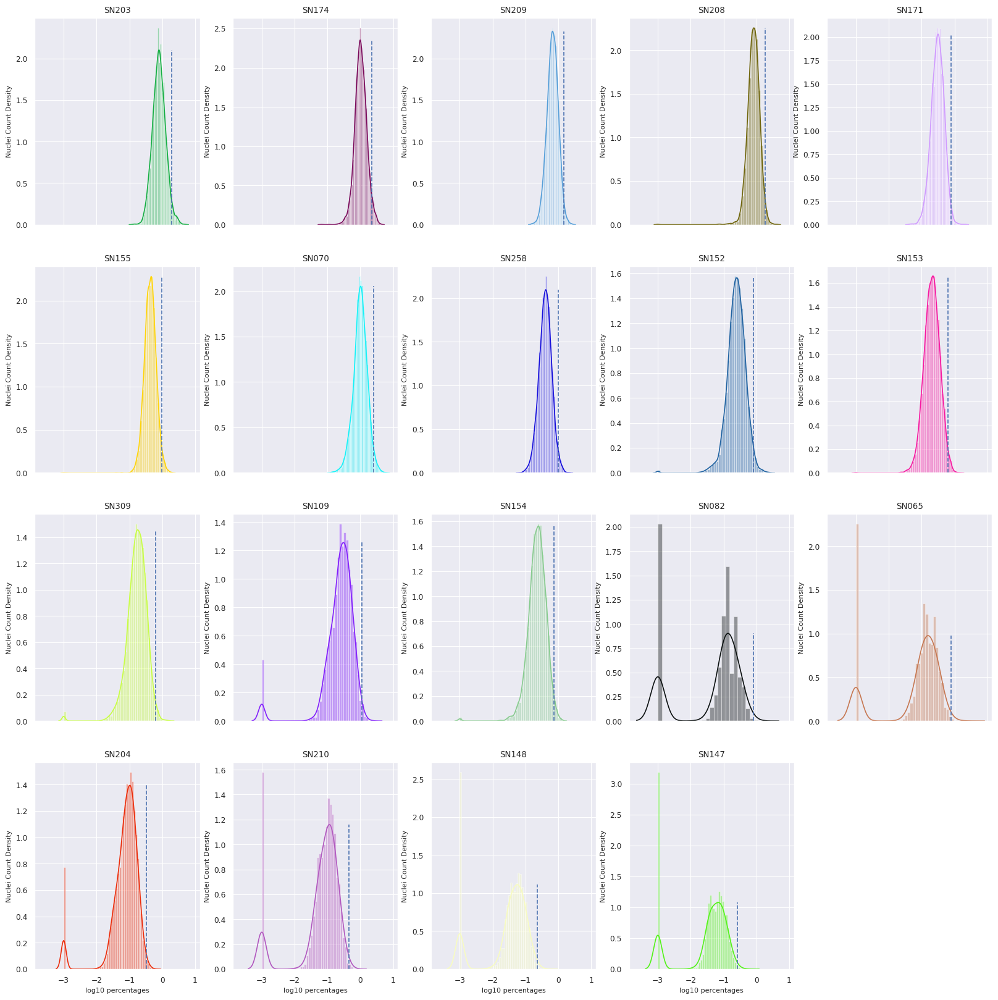

In [46]:
ribo_per_mks = []
for adata, ribo_mk in zip(adata_list[1:], ribo_mks):
    # remove all nuc with more than 3 MADs percentage ribo gene counts
    ribo_per_mks.append(pf.gene_set_MAD_plot_and_mask( adata, ribo_mk, 20.0))

In [47]:
for i, (adata, mask) in enumerate(zip(adata_list[1:], ribo_per_mks)):
    adata_list[i+1] = pf.mask_cells(adata, ~mask)

Number of removed nuclei per sample:
batch
SN062    349
SN097    296
SN283    274
SN096    218
SN297    210
SN120    192
SN207    180
SN023    176
SN222    174
SN022    171
SN232    151
SN035    141
SN095    135
SN105    132
SN149    124
SN121    119
SN003    115
SN134    110
SN308    108
SN133    105
SN060     99
SN061     98
SN030     94
SN234     93
SN029     92
SN026     89
SN034     86
SN100     85
SN009     82
SN136     77
SN033     71
SN021     58
SN170     57
SN214     55
SN122     54
SN080     43
SN233     36
SN213     11
Total removed =  4760
Number of removed nuclei per sample:
batch
SN104    240
SN252    157
SN150    148
SN251    141
SN101    137
SN250    133
SN073    128
SN017    126
SN016    118
SN013    114
SN014    110
SN006    107
SN126    105
SN015     90
SN106     82
SN010     73
SN127     70
SN039     63
SN102     54
SN032     51
SN025     50
SN099     48
SN128     42
SN069     40
SN063     30
SN088     27
SN044     25
SN038     15
SN108     10
SN043      8
Total re

In [48]:
# Remove mito and ribo genes
for i, (adata, mito_genes, ribo_genes) in enumerate(zip(adata_list[1:], mito_genes, [ribo_genes_human, ribo_genes_mouse, ribo_genes_human])):
    adata_list[i+1] = adata[:,~np.isin( adata.var['gene_symbol'], np.append(mito_genes, ribo_genes))]

### Handle XLOC identifiers

In [49]:
for adata in adata_list[1:]:
    print(sum(adata.var_names.str.startswith('XLOC')))

0
0
11501


In [50]:
sepp_data_opossum.var[sepp_data_opossum.var_names.str.startswith('XLOC')]

,ensembl_gene_id,gene_symbol,n_cells,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
XLOC_000027,XLOC_000027,XLOC_000027,1603,1603,0.017508,0.017356,98.388912,1742.0,7.463363
XLOC_000042,XLOC_000042,XLOC_000042,401,401,0.004131,0.004122,99.596977,411.0,6.021023
XLOC_000117,XLOC_000117,XLOC_000117,2282,2282,0.023478,0.023206,97.706487,2336.0,7.756623
XLOC_000122,XLOC_000122,XLOC_000122,516,516,0.005367,0.005353,99.481397,534.0,6.282267
XLOC_000127,XLOC_000127,XLOC_000127,2479,2479,0.025779,0.025453,97.508493,2565.0,7.850103
...,...,...,...,...,...,...,...,...,...
XLOC_069104,XLOC_069104,XLOC_069104,45,45,0.000462,0.000462,99.954773,46.0,3.850148
XLOC_069123,XLOC_069123,XLOC_069123,32,32,0.000322,0.000322,99.967839,32.0,3.496508
XLOC_070400,XLOC_070400,XLOC_070400,48,48,0.000492,0.000492,99.951758,49.0,3.912023
XLOC_071337,XLOC_071337,XLOC_071337,25,25,0.000261,0.000261,99.974874,26.0,3.295837


In [51]:
sepp_data_opossum.shape

(99498, 28806)

In [52]:
sepp_data_opossum.var[sepp_data_opossum.var['ensembl_gene_id']=='ENSMODG00000005968']

,ensembl_gene_id,gene_symbol,n_cells,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
ENSMODG00000005968,ENSMODG00000005968,PDE6B,823,823,0.008352,0.008317,99.172848,831.0,6.723833


### Remove overly expressed features

MALAT1 known to be overexpressed and cause problems for normalization.

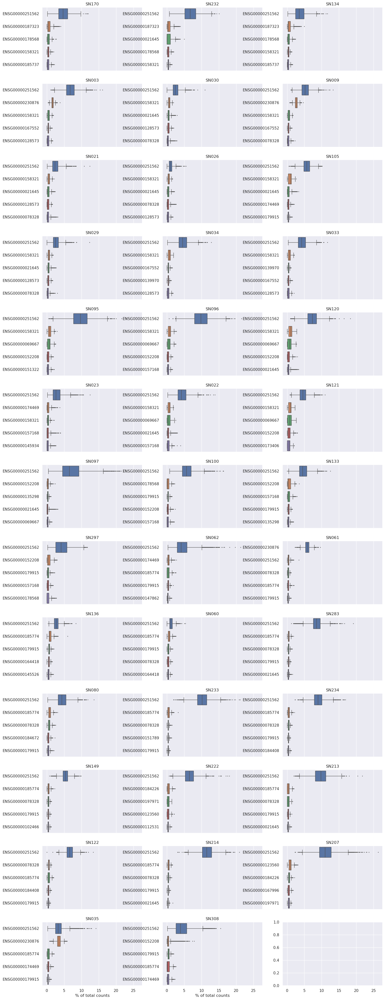

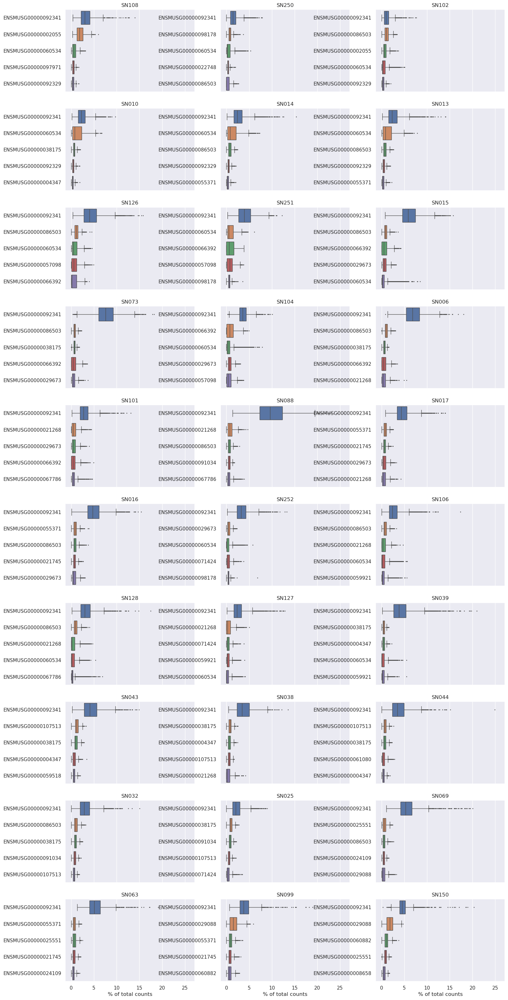

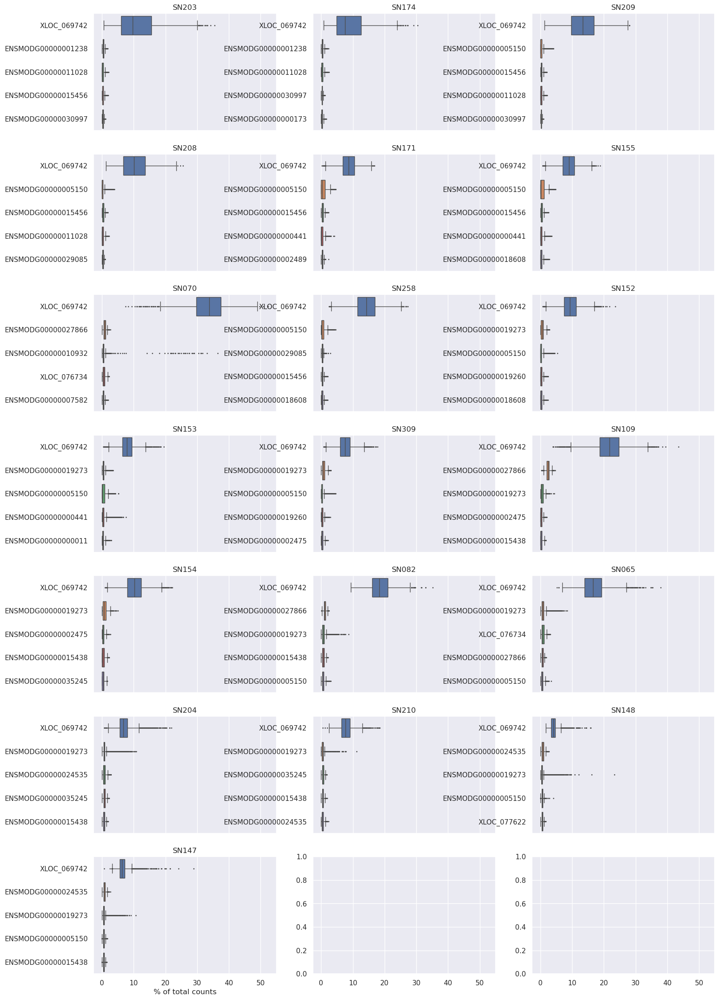

In [53]:
import math
for adata in adata_list[1:]:
    # plot highly expressed genes for each sample
    sns.set()
    n = len( adata.uns['batch_order'])
    fig, axes = plt.subplots( math.ceil( n/3), 3, figsize=( 18, math.ceil( n/3)*4), sharex=True)
    # loop through each sample
    for itr, (bat_itr, ax) in enumerate( zip( adata.uns['batch_order'], axes.flatten())):
        bat_mk = adata.obs['batch']==bat_itr
        bat_adata = adata[bat_mk,:].copy()
        plt.sca(ax)
        sc.pl.highest_expr_genes( bat_adata, n_top=5, ax=ax, show=False)
        plt.title( bat_itr)

Potentially problematic genes:\
\
Human\
ENSG00000251562 - [MALAT1](http://asia.ensembl.org/Homo_sapiens/Gene/Summary?db=core;g=ENSG00000251562;r=11:65497606-65508073)\
ENSG00000230876 - [LINC00486](http://asia.ensembl.org/Homo_sapiens/Gene/Summary?db=core;g=ENSG00000230876;r=2:32825261-32926693) - only in batch SN061, seems unlikely to be biologically/developmentally significant, so we'll get rid of it just in case expression is high enough to impact normalisation\
\
Mouse\
ENSMUSG00000092341 - [Malat1](http://asia.ensembl.org/Mus_musculus/Gene/Summary?db=core;g=ENSMUSG00000092341;r=19:5845717-5853602)\
ENSMUSG00000002055 - [Spag5](http://asia.ensembl.org/Mus_musculus/Gene/Summary?db=core;g=ENSMUSG00000002055;r=11:78192355-78213283) - quite high in SN108 and is a sperm-associated antigen, which surely shouldn't be present in any great amount in brain cells. [Uniprot](https://www.uniprot.org/uniprotkb/Q7TME2/entry) suggests it is involved in the mitotic spindle in diving cells, present as a stress response in non-mitotic cells. May be due to a stress reponse in this batch? GTEx confirms primary expression in testis - remove\
ENSMUSG00000060534 - [Dcc](http://asia.ensembl.org/Mus_musculus/Gene/Summary?db=core;g=ENSMUSG00000060534;r=18:71386705-72484140), also see [Uniprot entry](https://www.uniprot.org/uniprotkb/P70211/entry) which places it as a "receptor for netrin required for axon guidance" - this is not universally overexpressed in the mouse samples and isn't expressed as strongly as Malat1, so this may be a useful marker to keep in and correlate to particular phases of development\
\
Opossum\
XLOC_069742 - Appears to be the MALAT1 orthologue 

In [54]:
# HUMAN
adata_list[1] = adata_list[1][:,adata_list[1].var_names!='ENSG00000251562']
adata_list[1] = adata_list[1][:,adata_list[1].var_names!='ENSG00000230876']
# MOUSE
adata_list[2] = adata_list[2][:,adata_list[2].var_names!='ENSMUSG00000092341']
adata_list[2] = adata_list[2][:,adata_list[2].var_names!='ENSMUSG00000002055']
# OPOSSUM
adata_list[3] = adata_list[3][:,adata_list[3].var_names!='XLOC_069742']

In [ ]:
# Recheck highly expressed genes
for adata in adata_list[1:]:
    # plot highly expressed genes for each sample
    sns.set()
    n = len( adata.uns['batch_order'])
    fig, axes = plt.subplots( math.ceil( n/3), 3, figsize=( 18, math.ceil( n/3)*4), sharex=True)
    # loop through each sample
    for itr, (bat_itr, ax) in enumerate( zip( adata.uns['batch_order'], axes.flatten())):
        bat_mk = adata.obs['batch']==bat_itr
        bat_adata = adata[bat_mk,:].copy()
        plt.sca(ax)
        sc.pl.highest_expr_genes( bat_adata, n_top=5, ax=ax, show=False)
        plt.title( bat_itr)

[ENSG00000152208](http://asia.ensembl.org/Homo_sapiens/Gene/Summary?g=ENSG00000152208;r=4:92303966-93810157)(GRID2) is quite highly expressed in a subset of cells, up to about 8% of total counts in some cells. Glutamate receptor, noted expression in certain brain regions. Uniprot says it promotes synaptogenesis, probably shouldn't remove.\
Similar for Dcc for mouse (see above). Both are associated with CNS development so seem biologically relevant and are likely correlated with developmental stage. Keep.

In [ ]:
print(adata_list[1].shape)
print(adata_list[2].shape)
print(adata_list[3].shape)

In [ ]:
adata_list[1].write_h5ad('/group/ll005/cmcphan/sepp_data/sepp_human.h5ad')
adata_list[2].write_h5ad('/group/ll005/cmcphan/sepp_data/sepp_mouse.h5ad')
adata_list[3].write_h5ad('/group/ll005/cmcphan/sepp_data/sepp_opossum.h5ad')

In [4]:
sepp_data_human.obs[['Stage', 'age', 'numerical_age']].drop_duplicates().sort_values(by='numerical_age')

,Stage,age,numerical_age
SN134_HUM_CS18_CTCTCGAAGTGACCTT-1,7 wpc,7wpc,-0.594521
SN003_HUM_CS22_CTAGCCTGTCAGATAA-1,8 wpc,8wpc,-0.575342
SN095_HUM_09wpc_ATTGGACGTTATTCTC-1,9 wpc,9wpc,-0.556164
SN022_HUM_11wpc_GGCGACTGTCTCGTTC-1,11 wpc,11wpc,-0.517808
SN097_HUM_17wpc_GATCGTACAAAGCAAT-1,17 wpc,17wpc,-0.402740
SN297_HUM_20wpc_ACATCGACAGCTTCGG-1,20 wpc,20wpc,-0.345205
SN062_HUM_newborn_AACGTTGCAAACGTGG-1,newborn,5d,0.013699
SN061_HUM_infant_GTTACAGAGTCATGCT-1,infant,6m,0.500000
SN136_HUM_infant_TGATTTCGTTAAGTCC-1,infant,7m,0.583333
SN060_HUM_infant_ATTTCTGCATGGATGG-1,infant,9m,0.750000
